# Assignment #2

# 1. Random Variables (20 pts)

*Note that all proofs must be done using Latex in the corresponding cell block.

**1.1** Prove that $E[aX + b] = aE[X] + b$

$E[aX + b] = \sum_{x}(ax + b)p(x)$

$E[aX + b] = \sum_{x} \big( (ax) \cdot p(x) + b \cdot p(x) \big) $

$E[aX+b]=\sum_{x}(ax) \cdot p(x) + \sum_{x}b \cdot p(x)$

$E[aX+b]=a \cdot \underbrace{\big(\sum_{x}x \cdot p(x)\big)}_{E[X]} + b \cdot \underbrace{\big(\sum_{x}p(x)\big)}_{1}$

$E[aX + b] = aE[X] + b$

**1.2** Prove that $Var(X) = E[X^2] - E[X]^2$.

$Var(𝑋) = 𝐸[(𝑋 − 𝐸[𝑋])^2]$

$Var(𝑋) = 𝐸[(𝑋 − 𝐸[𝑋]) \cdot (𝑋 − 𝐸[𝑋])]$

$Var(𝑋) = 𝐸[𝑋^2 − 2𝑋 \cdot 𝐸[𝑋] + (𝐸[𝑋])^2]$

$Var(𝑋) = 𝐸[𝑋^2] − 2𝐸[𝑋 \cdot 𝐸[𝑋]] + 𝐸[(𝐸[𝑋])^2]$

$Var(𝑋) = 𝐸[𝑋^2] − 2𝐸[𝑋] \cdot 𝐸[𝑋] + 𝐸[(𝐸[𝑋])^2]$

$Var(𝑋) = 𝐸[𝑋^2] − 2(𝐸[𝑋])^2 + (𝐸[𝑋])^2$

$Var(𝑋) = 𝐸[𝑋^2] − (𝐸[𝑋])^2$

**1.3** Prove that $Var(X+Y) = Var(X) + Var(Y) + 2Cov(X,Y)$

calculate Cov(X,Y):

$Cov(X, Y) = E[(X - E[X]) \cdot (Y - E[Y])]$

$Cov(X, Y) = E[XY - X \cdot E[Y] - Y \cdot E[X] + E[X]E[Y]]$

$Cov(X, Y) = E[XY] - E[X]E[Y] - E[X]E[Y] + E[X]E[Y]$

$Cov(X, Y) = E[XY] - E[X] \cdot E[Y]$

then:

$Var(X + Y) = E[(X + Y)^2] -(E[X+Y])^2$

$Var(X + Y) = E[X^2 + 2XY + Y^2] - (E[X] + E[Y])^2$

$Var(X + Y) = E[X^2] + E[2XY] + E[Y^2] - E[X]^2 - 2E[X] \cdot E[Y] - E[Y]^2$

$Var(X + Y) = \underbrace{\big(E[X^2] - E[X]^2\big)}_{Var(X)} + \underbrace{\big(E[Y^2] - E[Y]^2\big)}_{Var(Y)} + 2 \underbrace{\big(E[XY] - E[X] \cdot E[Y]\big)}_{Cov(X,Y)}$

$Var(X+Y) = Var(X) + Var(Y) + 2Cov(X,Y)$

**1.4** Given the probability density function of the uniform distribution:

$$
f_X = 
\begin{cases}
\frac{1}{b-a} & a \le x \le b, \\
0 & \text{for}\;x \lt a\;\text{or}\;x \gt b.
\end{cases}$$

Prove that $E[X] = \frac{a+b}{2}$ and $Var(X) = \frac{(b-a)^2}{12}$.

$E[X] = \int xf(x) dx$
$=\int_a^b \frac {x}{b-a} dx = \frac{a+b}{2}$ 

because: 

$Var(X) = E[X^2] - E[X]^2$

thus:

$Var(X) = \int_{a^2}^{b^2} \frac {x^2}{b^2-a^2} dx - (\frac{a+b}{2})^2$
$=\frac{(b-a)^2}{12}$

# 2. Sentinel-2 data over Durham (20 points)
The objective of this problem is to learn how to download, process, and plot spatial data. More specifically, we are going to use data from the version 2.0 of the harmonized-landsat-sentinel-2 (HLS, https://lpdaac.usgs.gov/data/get-started-data/collection-overview/missions/harmonized-landsat-sentinel-2-hls-overview/) dataset. Begin by opening an account on earthdata.nasa.gov. Then proceed to find and download HLS data to your Docker container for Durham, NC on 09/10/2021. More specifically, the desired bounding box is between longitudes -79.0 and -78.8 and latitudes 35.90 and 36.10. You will need to download a larger region and then subset it on the docker container. You will want to first reproject all your downloaded files to a Plate Carree projection (i.e., regular lat/lon grid) at a 1 arcsec spatial resolution. Proceed to then create a RGB plot using the corresponding Sentinel-2 bands. Converting the radiances \"felt\" by the satellite to RGB values is not trivial but we will keep it simple; for this problem simply normalize each corresponding band to 0-1 or 0-255 (either will work). Once this is complete, create a map of NDVI (https://gisgeography.com/ndvi-normalized-difference-vegetation-index/) as well.

In [1]:
%%bash
gdalwarp -te -79.0 35.9 -78.8 36.1 -tr 0.00028 0.00028 -r near -overwrite -t_srs EPSG:4326 /home/jovyan/work/ESDA_xjw/Assignment/HLS/HLS.S30.T17SPV.2021253T155819.v2.0.B02.tif /home/jovyan/work/ESDA_xjw/Assignment/HLS/blue.tif
gdalwarp -te -79.0 35.9 -78.8 36.1 -tr 0.00028 0.00028 -r near -overwrite -t_srs EPSG:4326 /home/jovyan/work/ESDA_xjw/Assignment/HLS/HLS.S30.T17SPV.2021253T155819.v2.0.B03.tif /home/jovyan/work/ESDA_xjw/Assignment/HLS/green.tif
gdalwarp -te -79.0 35.9 -78.8 36.1 -tr 0.00028 0.00028 -r near -overwrite -t_srs EPSG:4326 /home/jovyan/work/ESDA_xjw/Assignment/HLS/HLS.S30.T17SPV.2021253T155819.v2.0.B04.tif /home/jovyan/work/ESDA_xjw/Assignment/HLS/red.tif
gdalwarp -te -79.0 35.9 -78.8 36.1 -tr 0.00028 0.00028 -r near -overwrite -t_srs EPSG:4326 /home/jovyan/work/ESDA_xjw/Assignment/HLS/HLS.S30.T17SPV.2021253T155819.v2.0.B08.tif /home/jovyan/work/ESDA_xjw/Assignment/HLS/nir.tif
# gdalinfo /home/jovyan/work/ESDA_xjw/Assignment/HLS/blue.tif

Creating output file that is 714P x 714L.
Processing /home/jovyan/work/ESDA_xjw/Assignment/HLS/HLS.S30.T17SPV.2021253T155819.v2.0.B02.tif [1/1] : 0Using internal nodata values (e.g. -9999) for image /home/jovyan/work/ESDA_xjw/Assignment/HLS/HLS.S30.T17SPV.2021253T155819.v2.0.B02.tif.
Copying nodata values from source /home/jovyan/work/ESDA_xjw/Assignment/HLS/HLS.S30.T17SPV.2021253T155819.v2.0.B02.tif to destination /home/jovyan/work/ESDA_xjw/Assignment/HLS/blue.tif.
...10...20...30...40...50...60...70...80...90...100 - done.
Creating output file that is 714P x 714L.
Processing /home/jovyan/work/ESDA_xjw/Assignment/HLS/HLS.S30.T17SPV.2021253T155819.v2.0.B03.tif [1/1] : 0Using internal nodata values (e.g. -9999) for image /home/jovyan/work/ESDA_xjw/Assignment/HLS/HLS.S30.T17SPV.2021253T155819.v2.0.B03.tif.
Copying nodata values from source /home/jovyan/work/ESDA_xjw/Assignment/HLS/HLS.S30.T17SPV.2021253T155819.v2.0.B03.tif to destination /home/jovyan/work/ESDA_xjw/Assignment/HLS/green.ti

pj_obj_create: Open of /opt/conda/share/proj failed
pj_obj_create: Open of /opt/conda/share/proj failed
pj_obj_create: Open of /opt/conda/share/proj failed
pj_obj_create: Open of /opt/conda/share/proj failed
pj_obj_create: Open of /opt/conda/share/proj failed
pj_obj_create: Open of /opt/conda/share/proj failed
pj_obj_create: Open of /opt/conda/share/proj failed
pj_obj_create: Open of /opt/conda/share/proj failed
pj_obj_create: Open of /opt/conda/share/proj failed
pj_obj_create: Open of /opt/conda/share/proj failed
pj_obj_create: Open of /opt/conda/share/proj failed
pj_obj_create: Open of /opt/conda/share/proj failed
pj_obj_create: Open of /opt/conda/share/proj failed
pj_obj_create: Open of /opt/conda/share/proj failed
pj_obj_create: Open of /opt/conda/share/proj failed
pj_obj_create: Open of /opt/conda/share/proj failed


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


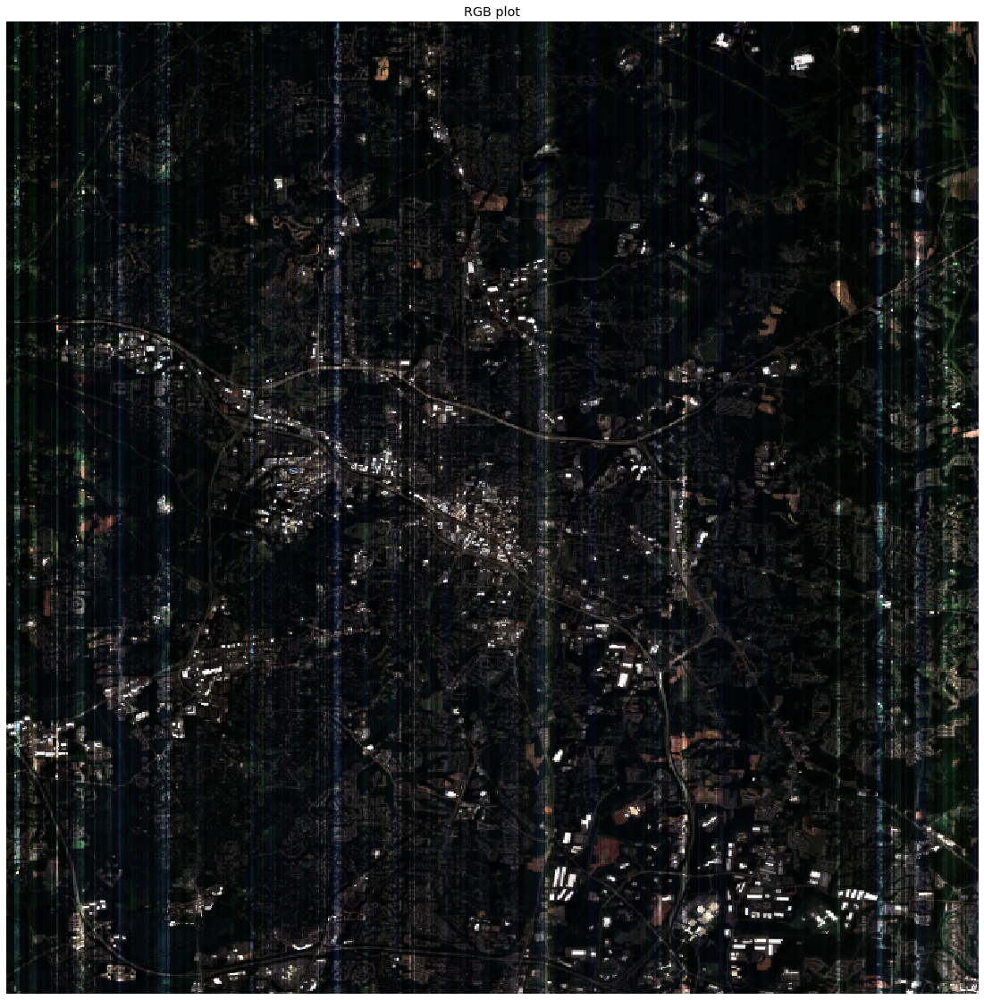

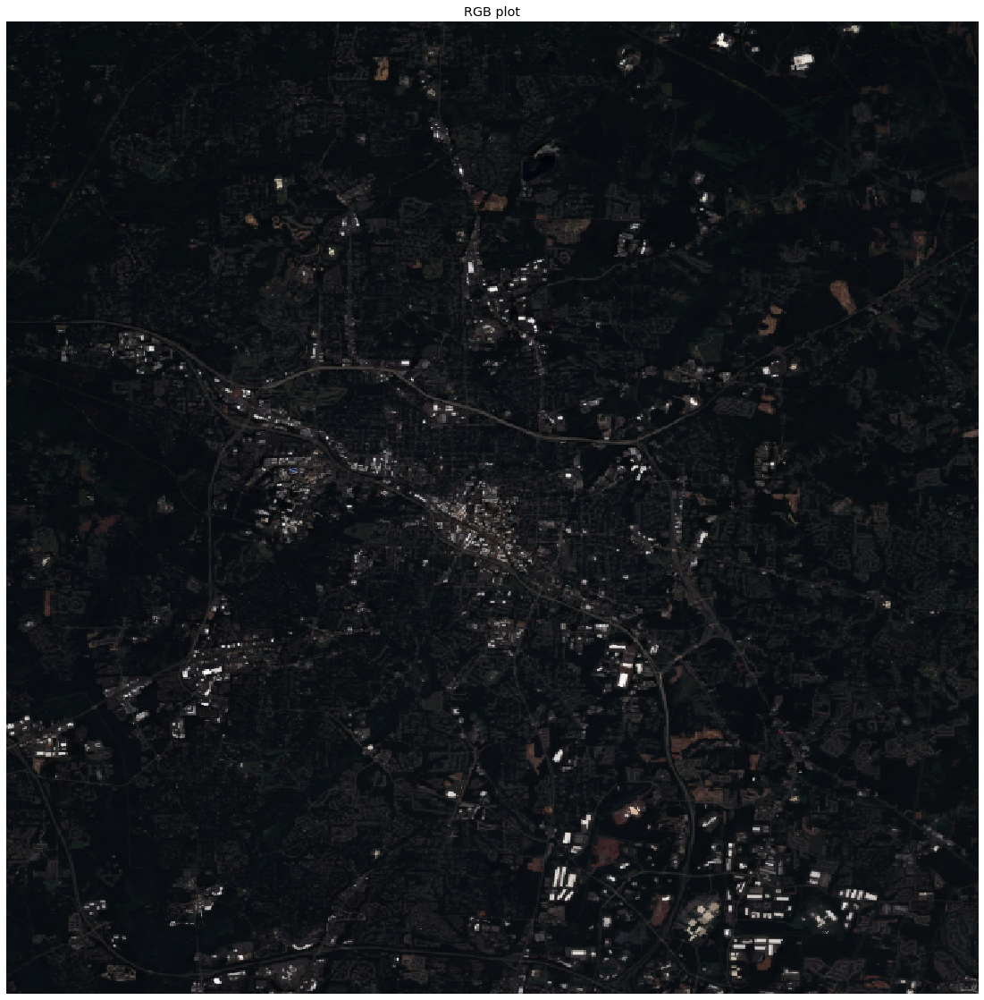

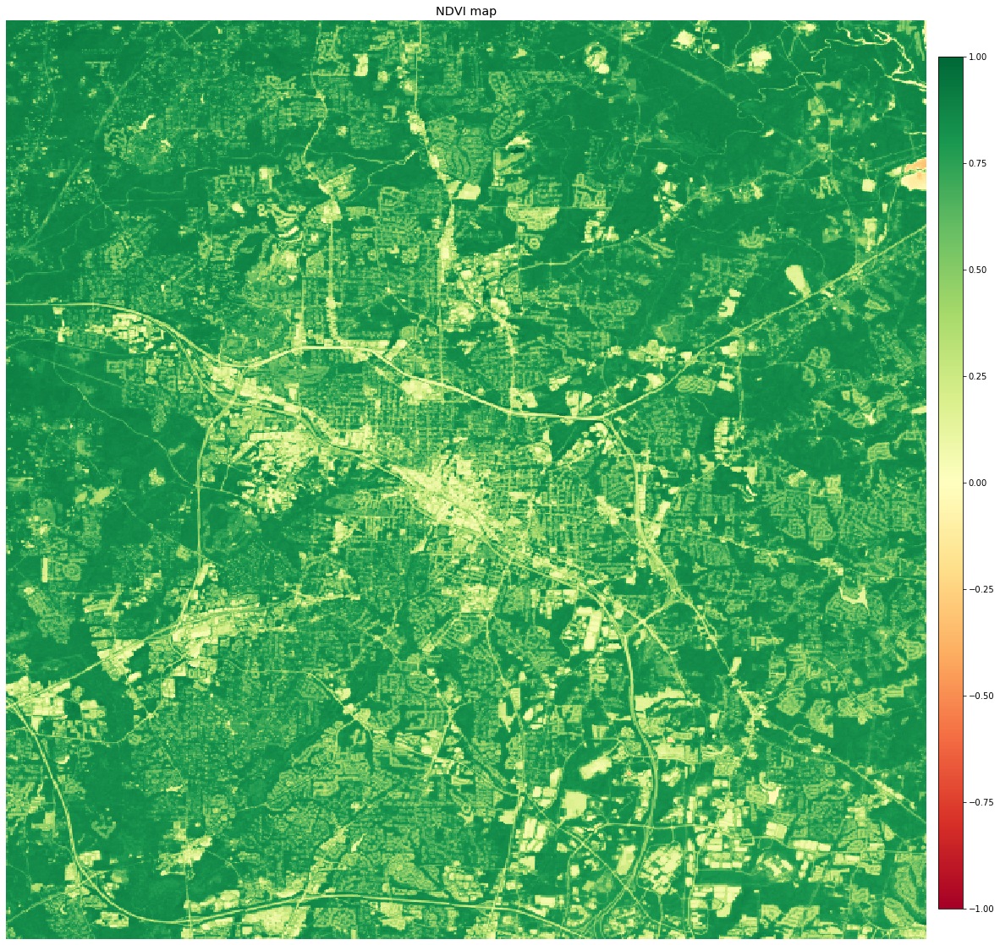

In [30]:
import rasterio
import numpy as np
from sklearn.preprocessing import minmax_scale
import matplotlib.pyplot as plt

red_file = rasterio.open('/home/jovyan/work/ESDA_xjw/Assignment/HLS/red.tif')
red_data = red_file.read(1)
red_normalized = minmax_scale(red_data, feature_range=(0, 1))

green_file = rasterio.open('/home/jovyan/work/ESDA_xjw/Assignment/HLS/green.tif')
green_data = green_file.read(1)
green_normalized = minmax_scale(green_data, feature_range=(0, 1))

blue_file = rasterio.open('/home/jovyan/work/ESDA_xjw/Assignment/HLS/blue.tif')
blue_data = blue_file.read(1)
blue_normalized = minmax_scale(blue_data, feature_range=(0, 1))

rgb_normalized_separate = np.dstack((red_normalized, green_normalized, blue_normalized))
plt.figure(figsize=(20, 20))
plt.imshow(rgb_normalized_separate)  # normalized separately
plt.axis('off')
plt.title('RGB plot', fontsize='x-large')
plt.show()

rgb_data = np.dstack((red_data, green_data, blue_data))
rgb_data_ascolumns = rgb_data.reshape(-1, 3)
rgb_data_ascolumns_nomalized = minmax_scale(rgb_data_ascolumns, feature_range=(0, 1))
rgb_normalized_together = rgb_data_ascolumns_nomalized.reshape(rgb_data.shape)
plt.figure(figsize=(20, 20))
plt.imshow(rgb_normalized_together)  # normalized together for 3 channels
plt.axis('off')
plt.title('RGB plot', fontsize='x-large')
plt.show()

nir_file = rasterio.open('/home/jovyan/work/ESDA_xjw/Assignment/HLS/nir.tif')
nir_data = nir_file.read(1)

ndvi_data = (nir_data - red_data) / (nir_data + red_data)
fig = plt.figure(figsize=(20, 20))
im = plt.imshow(ndvi_data, cmap=plt.get_cmap('RdYlGn'), vmin=-1, vmax=1)
plt.axis('off')
plt.title('NDVI map', fontsize='x-large')
# plt.colorbar()
cbar_ax = fig.add_axes([0.9, 0.15, 0.02, 0.7])
plt.colorbar(im, cax=cbar_ax)
plt.show()

# 3. Calculating the correct spatial mean (20 pts)

A simple spatial mean of a regular lat/long grid (Plate Carree) can lead to large discrepancies in the estimated spatial mean. To assess this impact, we are going to use the variable `t2m` in the annual ERA-Interim database (`/data/era-interim/era_interim_monthly_197901_201512_upscaled.nc_ann`). Start by assembling an array of actual area per pixel and then compute for each year the area weighted mean. Then compare the resulting time series to that resulting from using the equally weighted spatial mean (i.e., naive approach). Provide an explanation of your results.

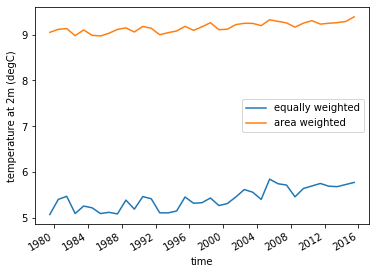

In [3]:
%matplotlib inline
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

file = '/data/era-interim/era_interim_monthly_197901_201512_upscaled.nc_ann'
fp = xr.open_dataset(file)
t2m = fp['t2m']

# area weighted
area_weights = np.cos(np.deg2rad(t2m.lat))
t2m_area_weighted = (area_weights * t2m).groupby('time.year').mean(('lat','lon'))

# equally weighted mean
t2m_mean = t2m.groupby('time.year').mean(('lat','lon'))

#plotting
t2m_mean.plot(label = 'equally weighted')
t2m_area_weighted.plot(label = 'area weighted')
plt.ylabel('temperature at 2m (degC)')
plt.legend()

fp.close()

# 4. North Carolina county level elevation statistics (20 pts)

Given the shapefile of county boundaries (`/data/HW/HW2/NCDOT_County_Boundaries.shp`) and the USGS National Elevation Dataset (`/data/NED/NED.vrt`), compute the following statistics: the spatial mean, the spatial standard deviation, and the coefficient of variation of elevation per NC county. Once this database is assembled, use bar plots to show the results across all the counties (one bar plot per statistic). Explain the results. To make things simple you will want to use the Plate Carree projection (regular lat/lon grid) at a 0.01 by 0.01 arcdegree spatial resolution.

In [45]:
%%bash 
ogr2ogr -f "ESRI Shapefile" -t_srs EPSG:4326 /home/jovyan/work/ESDA_xjw/Assignment/county_boundaries.shp /data/HW/HW2/NCDOT_County_Boundaries.shp
# ogrinfo -so /home/jovyan/work/ESDA_xjw/Assignment/NCDOT_County_Boundaries_latlon.shp

pj_obj_create: Open of /opt/conda/share/proj failed
pj_obj_create: Open of /opt/conda/share/proj failed
Warning 1: Value 8650425940.67700195 of field ShapeSTAre of feature 0 not successfully written. Possibly due to too larger number with respect to field width
pj_obj_create: Open of /opt/conda/share/proj failed
Warning 1: Value 9640705372.42895508 of field ShapeSTAre of feature 1 not successfully written. Possibly due to too larger number with respect to field width
pj_obj_create: Open of /opt/conda/share/proj failed
Warning 1: Value 16670616923.6434326 of field ShapeSTAre of feature 2 not successfully written. Possibly due to too larger number with respect to field width
pj_obj_create: Open of /opt/conda/share/proj failed
Warning 1: Value 21111749733.5128784 of field ShapeSTAre of feature 3 not successfully written. Possibly due to too larger number with respect to field width
pj_obj_create: Open of /opt/conda/share/proj failed
Warning 1: Value 17827945414.4955444 of field ShapeSTAre

In [46]:
%%bash
gdal_rasterize -l county_boundaries -a FIPS -te -85 33 -75 37 -tr 0.01 0.01 /home/jovyan/work/ESDA_xjw/Assignment/county_boundaries.shp /home/jovyan/work/ESDA_xjw/Assignment/county_boundaries.tif

0...10...20...30...40...50...60...70...80...90...100 - done.


In [5]:
%%bash
gdalwarp -te -85 33 -75 37 -tr 0.01 0.01 -r near -overwrite /data/NED/NED.vrt /home/jovyan/work/ESDA_xjw/Assignment/dem_nc.tif

Creating output file that is 1000P x 400L.
Processing /data/NED/NED.vrt [1/1] : 0Using internal nodata values (e.g. -99999) for image /data/NED/NED.vrt.
Copying nodata values from source /data/NED/NED.vrt to destination /home/jovyan/work/ESDA_xjw/Assignment/dem_nc.tif.
...10...20...30...40...50...60...70...80...90...100 - done.


In [6]:
# %%bash 
# gdalinfo county_boundaries.tif

Text(0, 0.5, 'variation corefficient of elevation in North Carolina counties')

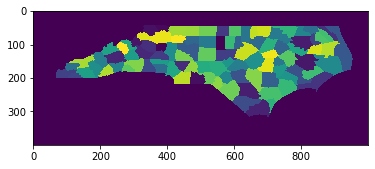

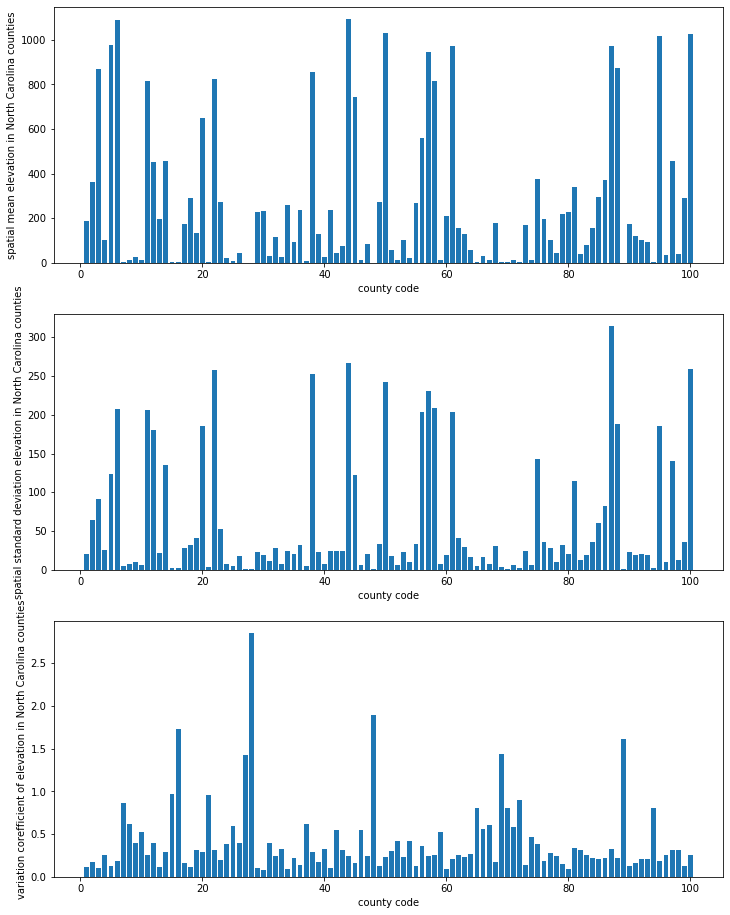

In [53]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
from collections import defaultdict

# dem=rasterio.open('/home/jovyan/work/ESDA_xjw/Assignment/dem_nc.tif').read(1)
# tmp=gpd.GeoDataFrame.from_file('/data/HW/HW2/NCDOT_County_Boundaries.shp')
# tmpWGS84=tmp.to_crs({'proj':'longlat','ellps':'WGS84','datum':'WGS84'})
# tmpWGS84.to_file('/home/jovyan/work/ESDA_xjw/Assignment/county_boundaries.shp')

# county=cartopy.io.shapereader.Reader('/home/jovyan/work/ESDA_xjw/Assignment/county_boundaries.shp').geometries()
# img_extent=[-85,-75,33,37]
# ax=plt.axes(projection=cartopy.crs.PlateCarree())
# im=plt.imshow(dem,transform=cartopy.crs.PlateCarree(),cmap=plt.get_cmap('terrain'),extent=(img_extent))
# ax.add_feature(cartopy.feature.ShapelyFeature(county,cartopy.crs.PlateCarree(),edgecolor='black'))
# cb=plt.colorbar(im,orientation='horizontal')

file = '/home/jovyan/work/ESDA_xjw/Assignment/county_boundaries.tif'
county_data = rasterio.open(file).read(1)
dem_data = rasterio.open('/home/jovyan/work/ESDA_xjw/Assignment/dem_nc.tif').read(1)
plt.imshow(county_data)

d=defaultdict(list)
for i in range(dem_data.shape[0] - 1):
    for j in range(dem_data.shape[1] - 1):
        if county_data[i][j]!=0:
            d[county_data[i][j]].append(dem_data[i][j])
            
elev_mean,elev_std = [],[]
for county in sorted(d.items(),key=lambda item: item[0]):
    elev_mean.append(np.mean(county[1]))
    elev_std.append(np.std(county[1]))
elev_mean = np.array(elev_mean)
elev_std = np.array(elev_std)
elev_covar=elev_std/elev_mean

ct_code=np.arange(1,elev_mean.size+1)
fig,axs=plt.subplots(3,figsize=(12,16))
axs[0].bar(ct_code,elev_mean)
axs[0].set_xlabel('county code')
axs[0].set_ylabel('spatial mean elevation in North Carolina counties')
axs[1].bar(ct_code,elev_std)
axs[1].set_xlabel('county code')
axs[1].set_ylabel('spatial standard deviation elevation in North Carolina counties')
axs[2].bar(ct_code,elev_covar)
axs[2].set_xlabel('county code')
axs[2].set_ylabel('variation corefficient of elevation in North Carolina counties')

# The mean elevation for each county is intuitive. It shows the average elevation for
# each, here we can see that NC county varies a lot in their average elevation.
# Standard deviation in elevation is related to the vertical relief of counties,
# with the greatest difference between their respective highest and lowest elevations.
# And for variation coefficient, the high CV value mean high uncertainty of modeling 
# results.


# 5. Flying from LAX to LHR (20 pts)

Create a rotating globe that tracks an actual flight from Los Angeles to London that happened between 2020/09/17-2020/09/18. The file `/data/HW/HW2/lax2lhr_20200917.pck` contains the GPS location of the flight at discrete timestamps during the flight. The goal here is to create a movie where each frame builds on the previous one to build out the time evolving flight path. The flight path should be drawn as lines joined at nodes. Each frame update should correspond to a new timestamp. Furthermore, for each timestamp, the globe should be centered on the timestamp's corresponding longitude. Finally, add the time evolving rainfall maps that was forecasted during each timestamp. For this part, you will use a 9/17/2020 forecast from NOAA's Global Forecasting System (GFS) which you can find in  `/data/HW/HW2/gfs20200917_gfs_0p25_1hr_00z.nc`. The variable of interest in that dataset will be `pratesfc`. Note that there are many ways to do this problem so feel free to explore your own ideas. However, for reference, below is an example of what the last frame might look like. We look forward to seeing what you come up with! 
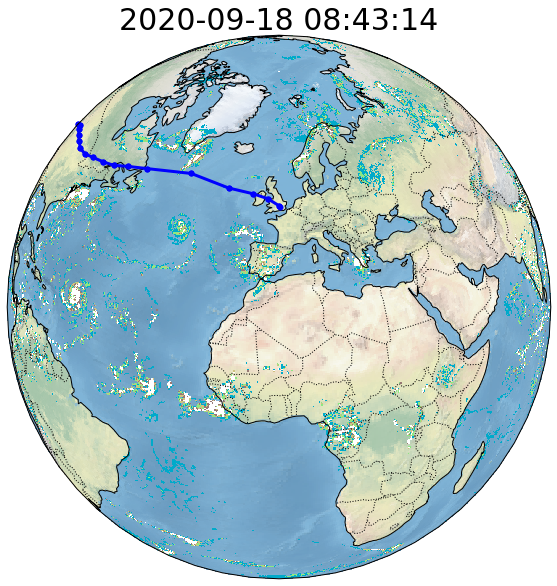

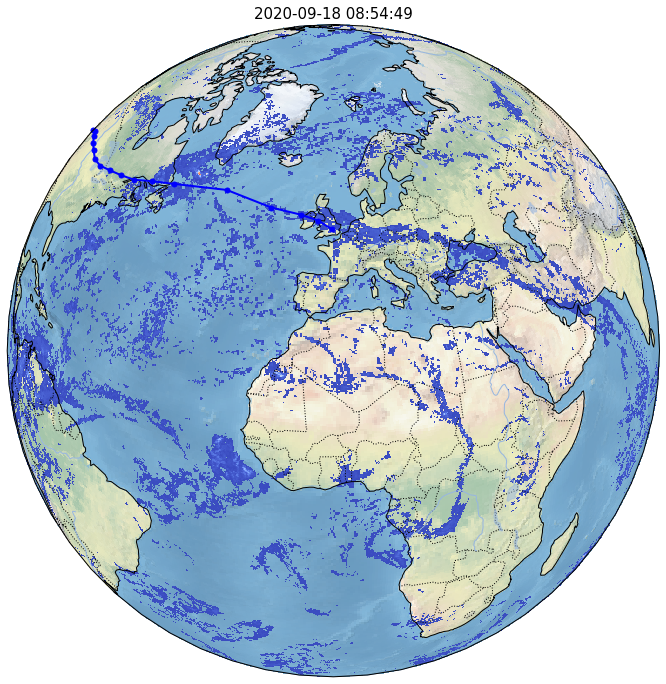

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import cartopy 
import pickle as pkl
import xarray as xr
from matplotlib import animation
from IPython.display import HTML

file = open('/data/HW/HW2/lax2lhr_20200917.pck','rb')

gpsinfo = pkl.load(file)
lat, lon, dates = gpsinfo['lat'], gpsinfo['lon'], gpsinfo['date']
lonlats = np.stack((lon,lat), axis=-1)

fp = xr.open_dataset('/data/HW/HW2/gfs20200917_gfs_0p25_1hr_00z.nc')
rainfall = fp['pratesfc'].sel(time=dates, method='nearest')

img_extent = (-180, 180, -90, 90)
fig = plt.figure(figsize=(12, 12))
masked_rainfall = np.ma.masked_array(rainfall, rainfall == 0)

def animate(i):
    plt.clf()
    ax = plt.axes(projection=cartopy.crs.Orthographic(central_longitude=lon[i],central_latitude=30))
    ax.stock_img()
    
    vmin = np.min(masked_rainfall[i])
    vmax = np.max(masked_rainfall[i])
    im = plt.imshow(masked_rainfall[i], vmin=vmin, vmax=vmax,
                    transform=cartopy.crs.PlateCarree(),
                    cmap=plt.get_cmap('coolwarm'), extent=(img_extent))
    plt.xticks([])
    plt.yticks([])
    
    ax.add_feature(cartopy.feature.LAND)
    ax.add_feature(cartopy.feature.OCEAN)
    ax.add_feature(cartopy.feature.BORDERS,linestyle=":")
    ax.add_feature(cartopy.feature.RIVERS)
    ax.add_feature(cartopy.feature.LAKES,alpha=0.5)
    ax.add_feature(cartopy.feature.COASTLINE)
  
    
    ax.set_title('%04d-%02d-%02d %02d:%02d:%02d' % (dates[i].year, dates[i].month, dates[i].day, dates[i].hour, dates[i].minute, dates[i].second), fontsize=15)
    
    line=plt.plot(lonlats[:i*1,0],lonlats[:i*1,1],color='blue',marker='.',markersize=10,linewidth=2,transform=cartopy.crs.PlateCarree())
    
    return(im, )

anim=animation.FuncAnimation(fig,animate,frames=len(dates),interval=300,blit=True)
HTML(anim.to_html5_video())

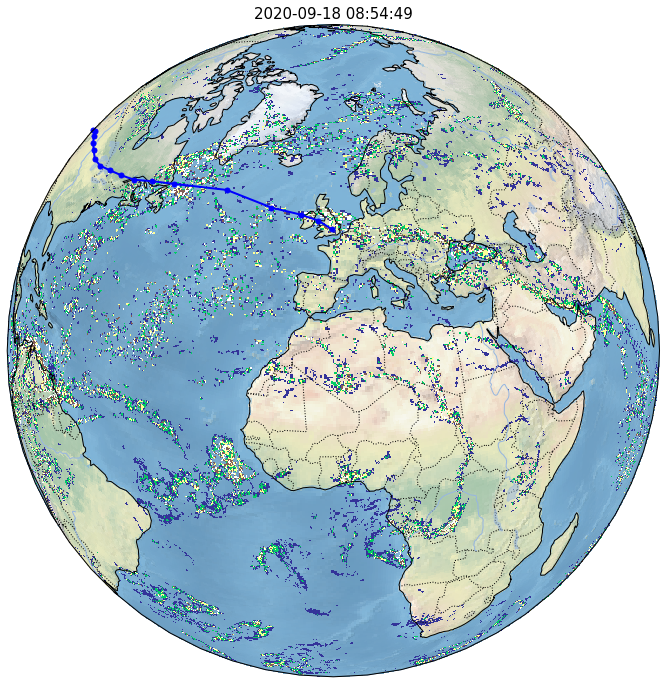

In [56]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import cartopy 
import pickle as pkl
import xarray as xr
from matplotlib import animation
from IPython.display import HTML

file = open('/data/HW/HW2/lax2lhr_20200917.pck','rb')

gpsinfo = pkl.load(file)
lat, lon, dates = gpsinfo['lat'], gpsinfo['lon'], gpsinfo['date']
lonlats = np.stack((lon,lat), axis=-1)

fp = xr.open_dataset('/data/HW/HW2/gfs20200917_gfs_0p25_1hr_00z.nc')
rainfall = fp['pratesfc'].sel(time=dates, method='nearest')

img_extent = (-180, 180, -90, 90)
fig = plt.figure(figsize=(12, 12))
masked_rainfall = np.ma.masked_array(rainfall, rainfall == 0)
masked_rainfall_nan = np.ma.masked_array(rainfall, rainfall == 0)
masked_rainfall_nan = np.ma.filled(masked_rainfall_nan, np.nan)
rainfall_10_percentile = np.nanpercentile(masked_rainfall_nan, 10)
rainfall_90_percentile = np.nanpercentile(masked_rainfall_nan, 90)
masked_rainfall = np.ma.masked_array(masked_rainfall, masked_rainfall < rainfall_10_percentile)
masked_rainfall = np.ma.masked_array(masked_rainfall, masked_rainfall > rainfall_90_percentile)

def animate(i):
    plt.clf()
    ax = plt.axes(projection=cartopy.crs.Orthographic(central_longitude=lon[i],central_latitude=30))
    ax.stock_img()
    
    vmin = np.min(masked_rainfall[i])
    vmax = np.max(masked_rainfall[i])
    im = plt.imshow(masked_rainfall[i], vmin=vmin, vmax=vmax,
                    transform=cartopy.crs.PlateCarree(),
                    cmap=plt.get_cmap('terrain'), extent=(img_extent))
    plt.xticks([])
    plt.yticks([])
    
    ax.add_feature(cartopy.feature.LAND)
    ax.add_feature(cartopy.feature.OCEAN)
    ax.add_feature(cartopy.feature.BORDERS,linestyle=":")
    ax.add_feature(cartopy.feature.RIVERS)
    ax.add_feature(cartopy.feature.LAKES,alpha=0.5)
    ax.add_feature(cartopy.feature.COASTLINE)
  
    
    ax.set_title('%04d-%02d-%02d %02d:%02d:%02d' % (dates[i].year, dates[i].month, dates[i].day, dates[i].hour, dates[i].minute, dates[i].second), fontsize=15)
    
    line=plt.plot(lonlats[:i*1,0],lonlats[:i*1,1],color='blue',marker='.',markersize=10,linewidth=2,transform=cartopy.crs.PlateCarree())
    
    return(im, )

anim=animation.FuncAnimation(fig,animate,frames=len(dates),interval=300,blit=True)
HTML(anim.to_html5_video())